Name: Avani Gupta <br>
Roll: 2019121004

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import time

In [2]:
def display_img_arr(img_arr, r, c, dim,titles_arr):
    fl = 0
    fig = plt.figure(figsize = dim)
    for i in range(r):
        for j in range(c):
            if len(img_arr) == fl:
                break
            ax1 = fig.add_subplot(r, c, fl + 1)
            ax1.set_title(titles_arr[fl], fontsize = 20)
            ax1.imshow(img_arr[fl], cmap = 'gray')
            fl = fl + 1
    plt.show()

## Question 5 Fourier Transform
1) Implement 2D DFT

In [3]:
def DFT2D(img):
    out_img = np.zeros(img.shape,dtype=complex)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            matSum = 0.0
            for m in range(img.shape[0]):
                for n in range(img.shape[1]):
                    matSum +=  img[m][n] * np.exp(- 2j * np.pi * ((i * m) / img.shape[0] + (j* n) / img.shape[1]))
            out_img[i,j] = matSum
    out_img = cv2.normalize(out_img.astype(np.float64) , 0, 255, cv2.NORM_MINMAX)
    return out_img.astype(np.float64)

(388, 291)
(32, 32)


<ipython-input-3-6b93b4652f1e>:10: ComplexWarning: Casting complex values to real discards the imaginary part
  out_img = cv2.normalize(out_img.astype(np.float64) , 0, 255, cv2.NORM_MINMAX)


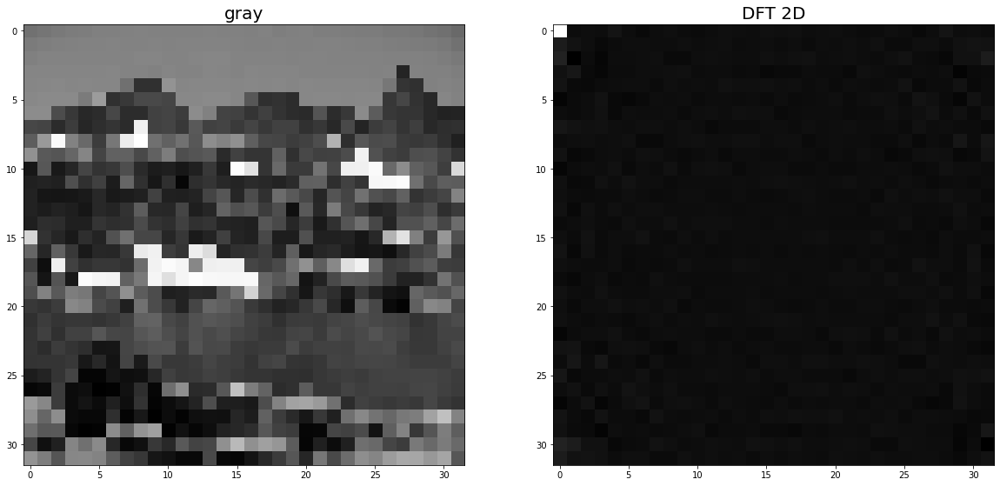

In [4]:
imgs = []
titles = []
path = "../images/"
img = cv2.cvtColor(cv2.imread(path+'mountain.jpg'), cv2.COLOR_BGR2RGB)
img_g = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
print(img_g.shape)
img_gr = cv2.resize(img_g, (32,32))
print(img_gr.shape)
dtfi = DFT2D(img_gr)
imgs.append(img_gr)
titles.append("gray")
imgs.append(dtfi)
titles.append("DFT 2D")
display_img_arr(imgs, 1, 2, (20,20),titles)


2. Implement 1D Fast Fourier Transform (Recursive Formulation). Use it to imple-
ment 2D FFT and display the result on suitable images of your choice. Compare
the run times of your version of DFT and FFT on different sized inputs and plot
them.

In [5]:
def recursive_FFT_1D(a):
    if  a.shape[0] == 1:
        return a
    E = []
    for k in range(int( a.shape[0] / 2)):
        arr = np.complex(0, -1) 
        cons = 2.0 * np.pi * k
        arr = arr*cons / a.shape[0]
        arr = np.exp(arr)
        E.append(arr)
    out_even = recursive_FFT_1D(a[0 : a.shape[0] : 2])
    out_odd = recursive_FFT_1D(a[1 : a.shape[0] : 2])
    return np.append(out_even + np.array(E)* out_odd, out_even - np.array(E) * out_odd)

In [6]:
ar = np.array([1,2,3,4])
print(recursive_FFT_1D(ar))
print("verifying")
print(np.fft.fft(ar))

[10.+0.j -2.+2.j -2.+0.j -2.-2.j]
verifying
[10.+0.j -2.+2.j -2.+0.j -2.-2.j]


In [7]:
#1D FFT
def recursive_FFT_1Dcol(a):
    if a.shape[1] == 1:
        return a
    E = []
    for k in range(int(a.shape[1] / 2)):
        arr = np.complex(0, -1) 
        cons = 2.0 * np.pi * k
        arr = arr*cons / a.shape[1]
        arr = np.exp(arr)
        E.append(arr)
    out_even = recursive_FFT_1Dcol(a[:, 0 : a.shape[1] : 2]);
    out_odd = recursive_FFT_1Dcol(a[:, 1 : a.shape[1] : 2]);
    return  np.append(out_even + np.array(E) * out_odd, out_even - np.array(E)* out_odd, axis = 1)

def RECURSIVEtwodFFT(I):
    return recursive_FFT_1Dcol(recursive_FFT_1Dcol(I).T).T

ar = np.array([[1,2], [3,4]])
print(RECURSIVEtwodFFT(ar))
print("verifying")
print(np.fft.fft2(ar))

[[10.+0.j -2.+0.j]
 [-4.+0.j  0.+0.j]]
verifying
[[10.+0.j -2.+0.j]
 [-4.+0.j  0.+0.j]]


In [8]:
#1D FFT
def recursive_FFT_1Dcol(a):
    if a.shape[1] == 1:
        return a
    E = []
    for k in range(int(a.shape[1] / 2)):
        arr = np.complex(0, -1) 
        cons = 2.0 * np.pi * k
        arr = arr*cons / a.shape[1]
        arr = np.exp(arr)
        E.append(arr)
    out_even = recursive_FFT_1Dcol(a[:, 0 : a.shape[1] : 2]);
    out_odd = recursive_FFT_1Dcol(a[:, 1 : a.shape[1] : 2]);
    return  np.append(out_even + np.array(E) * out_odd, out_even - np.array(E)* out_odd, axis = 1)

def RECURSIVEtwodFFT(I):
    return recursive_FFT_1Dcol(recursive_FFT_1Dcol(I).T).T

ar = np.array([[1,2], [3,4]])
print(RECURSIVEtwodFFT(ar))
print("verifying")
print(np.fft.fft2(ar))

[[10.+0.j -2.+0.j]
 [-4.+0.j  0.+0.j]]
verifying
[[10.+0.j -2.+0.j]
 [-4.+0.j  0.+0.j]]


In [9]:
def RECURSIVEtwodFFT(I):
    return recursive_FFT_1Dcol(recursive_FFT_1Dcol(I).T).T

ar = np.array([[1,2], [3,4]])
print(RECURSIVEtwodFFT(ar))
print("verifying")
print(np.fft.fft2(ar))

[[10.+0.j -2.+0.j]
 [-4.+0.j  0.+0.j]]
verifying
[[10.+0.j -2.+0.j]
 [-4.+0.j  0.+0.j]]


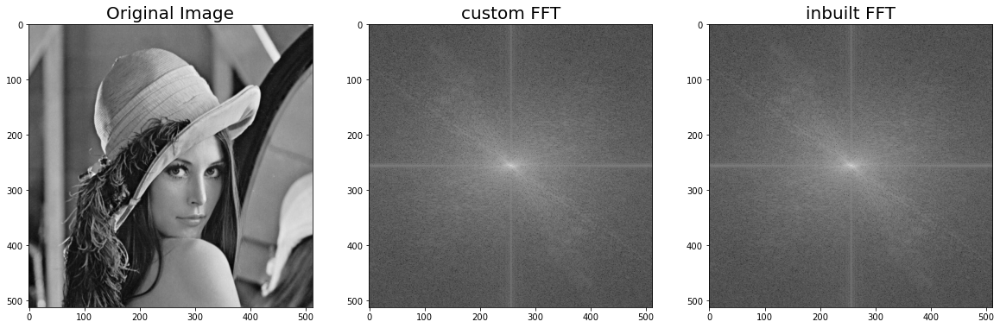

In [10]:
path = "../images/"
img = cv2.imread(path+'lena.jpg', cv2.IMREAD_GRAYSCALE)
images = []
titles = []
images.append(img)
titles.append('Original Image')
images.append(np.log(1 + np.abs(np.fft.fftshift(RECURSIVEtwodFFT(img)))))
titles.append('custom FFT')
images.append(np.log(1 + np.abs(np.fft.fftshift(np.fft.fft2(img)))))
titles.append('inbuilt FFT')
display_img_arr(images, 1, 3,(20,20), titles)

    Compare the run times of your version of DFT and FFT on different sized inputs and plot them.



In [11]:
def plotTime(x,fft,dft):
    
    fig = plt.figure()
    
    plt.xlabel('size of image(nxn)')
    plt.ylabel('time')
    x = np.array(x)
    fft = np.array(fft)
    dft = np.array(dft)

    plt.plot(x,fft,'r',label='fft')
    plt.plot(x,dft,'g',label='dft')
    
    plt.legend()
    plt.show()
                

In [12]:
dft_time = []
fft_time = []
size_arr = [4,8,16,32,64]

img = cv2.cvtColor(cv2.imread(path+'mountain.jpg'), cv2.COLOR_BGR2RGB)
img_g = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

for s in size_arr:
    img_gr = cv2.resize(img_g, (s,s))

    tic = time.time()
    dtfi = DFT2D(img_gr)
    tac = time.time()
    dft_time.append(tac-tic)


    tic = time.time()
    fft = RECURSIVEtwodFFT(img_gr)
    tac = time.time()
    fft_time.append(tac-tic)
    
# time is given in seconds

<ipython-input-3-6b93b4652f1e>:10: ComplexWarning: Casting complex values to real discards the imaginary part
  out_img = cv2.normalize(out_img.astype(np.float64) , 0, 255, cv2.NORM_MINMAX)


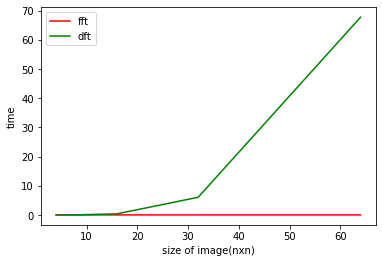

In [13]:
plotTime(size_arr,fft_time,dft_time)


3. Now, implement 2D Inverse FFT in a similar fashion.

In [14]:
def RECURSIVEtwodIFFT(I):
    return np.conj(RECURSIVEtwodFFT(I))/(I.shape[0]*I.shape[1])
ar = np.array([[1,2], [3,4]])
print(RECURSIVEtwodIFFT(ar))
print("verifying")
print(np.fft.ifft2(ar))

[[ 2.5-0.j -0.5+0.j]
 [-1. +0.j  0. -0.j]]
verifying
[[ 2.5+0.j -0.5+0.j]
 [-1. +0.j  0. +0.j]]


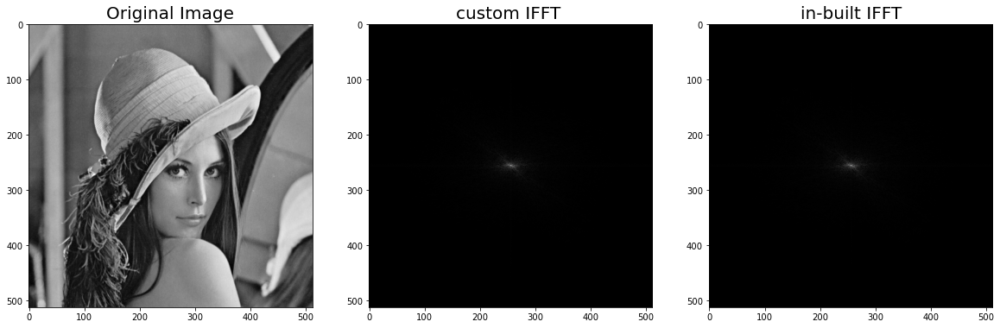

In [15]:

img = cv2.imread(path+'lena.jpg', cv2.IMREAD_GRAYSCALE)
images = []
titles = []
images.append(img)
titles.append('Original Image')
images.append(np.log(1 + np.abs(np.fft.fftshift(RECURSIVEtwodIFFT(img)))))
titles.append('custom IFFT ')
images.append(np.log(1 + np.abs(np.fft.fftshift(np.fft.ifft2(img)))))
titles.append('in-built IFFT')
display_img_arr(images, 1, 3,(20,20), titles)

4. Calculate the Fourier transform of the Fourier transform of any image. You would
observe that the image you get is similar to the original image. How is it different
from the original image? How can you fix this in the frequency domain so that we
would get the original image back instead?

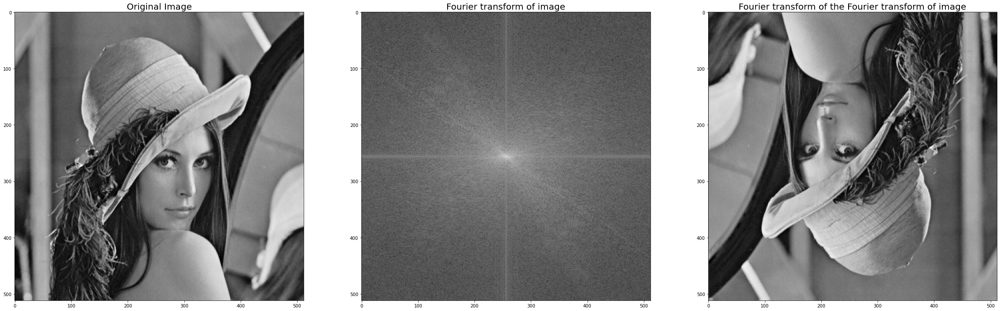

In [16]:
img = cv2.imread(path+'lena.jpg', cv2.IMREAD_GRAYSCALE)
images = []
titles = []
images.append(img)
titles.append('Original Image')
ft = RECURSIVEtwodFFT(img)
images.append(np.log(1+np.abs(np.fft.fftshift(ft))))
titles.append('Fourier transform of image')

img = np.abs(RECURSIVEtwodFFT(ft))
# img = img[::-1, ::-1]

images.append(img)
titles.append('Fourier transform of the Fourier transform of image')



display_img_arr(images, 1, 3,(40,40), titles)


Yes the image is similar to original image, just that it is inverted and flipped(laterally inverted)

We can fix this in frequency domain by taking conjugate of result in frequency domain as follows

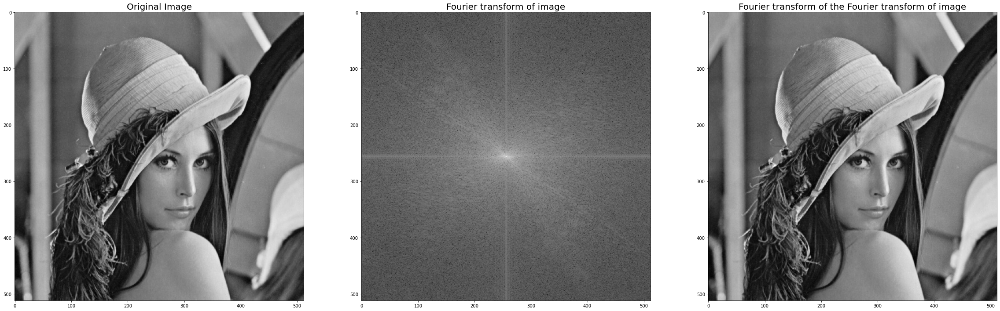

In [17]:
img = cv2.imread(path+'lena.jpg', cv2.IMREAD_GRAYSCALE)
images = []
titles = []
images.append(img)
titles.append('Original Image')
ft = RECURSIVEtwodFFT(img)
images.append(np.log(1+np.abs(np.fft.fftshift(ft))))
titles.append('Fourier transform of image')

img = np.abs(RECURSIVEtwodFFT(np.conj(ft)))


images.append(img)
titles.append('Fourier transform of the Fourier transform of image')



display_img_arr(images, 1, 3,(40,40), titles)



## Question 6. (30 points) Pick two images f,h of same dimension (256 × 256). Compute their respective Fourier transforms F, H.
1. Compute IFT(F.H) and f * h. Check whether IFT(F.H) corresponds to the center
portion of f * h. Compute the average of squared difference between pixel values
in IFT(F.H) and the central 256 × 256 portion of f * h (F.H denotes point-wise
multiplication of F and H and f * h denotes convolution with padding).

In [18]:

def pad(img,b_half):
    img_pad = cv2.copyMakeBorder(img, b_half, b_half, b_half, b_half,cv2.BORDER_CONSTANT)
    return img_pad

In [19]:
def convolve2d(im, k):
    # flipping second image
    k = np.flip(k, axis=0) #rows flip
    k = np.flip(k, axis=1)  #columns flip
    # padding first image
    im = im.astype(np.float64)
    im = pad(im,int(im.shape[0]/2))
    
    k = k.astype(np.float64)
    res = np.zeros(im.shape).astype(np.float64)
    rows = int(k.shape[0]/ 2)
    cols = im.shape[0] - int((k.shape[0]-1) / 2)
    cols2 = im.shape[1] - int((k.shape[1] - 1) / 2)
    for i in range(rows, cols):
        for j in range(int(k.shape[1]/ 2),cols2):
            res[i][j] = sum(sum(k @ im[i - rows : i + int((k.shape[0] - 1) / 2) + 1, j - int(k.shape[1] / 2) : j + int((k.shape[1] - 1) / 2) + 1]))
    res = cv2.normalize(res.astype('float64'), 0, 255, cv2.NORM_MINMAX)
    return res.astype('float64')

In [20]:
img = cv2.imread(path+'lena.jpg', cv2.IMREAD_GRAYSCALE)
f = cv2.resize(img,(256,256))
img2 = cv2.imread(path+'cake_flash.jpg', cv2.IMREAD_GRAYSCALE)
h = cv2.resize(img2,(256,256))

In [21]:

F = RECURSIVEtwodFFT(f)
H =  RECURSIVEtwodFFT(h)
FH = np.multiply(F,H)
fconvh = convolve2d(f ,h )

iftfh = RECURSIVEtwodIFFT(fconvh)
iftFH = RECURSIVEtwodIFFT(FH)
images = [F,H,fconvh,FH,iftfh,iftFH]
displayImages = []

images = [F,H,fconvh,FH,iftFH]
displayImages = []
displayImages.append(f)
displayImages.append(h)
displayImages.append(np.log(1+np.abs(np.fft.fftshift(F.astype('float64')))))
displayImages.append(np.log(1+np.abs(np.fft.fftshift(H.astype('float64')))))
displayImages.append(fconvh)
displayImages.append(np.log(1+np.abs(np.fft.fftshift(FH.astype('float64')))))
displayImages.append(np.fft.fftshift(iftFH.astype('float64')))

<ipython-input-21-61d4fd88bf44>:15: ComplexWarning: Casting complex values to real discards the imaginary part
  displayImages.append(np.log(1+np.abs(np.fft.fftshift(F.astype('float64')))))
<ipython-input-21-61d4fd88bf44>:16: ComplexWarning: Casting complex values to real discards the imaginary part
  displayImages.append(np.log(1+np.abs(np.fft.fftshift(H.astype('float64')))))
<ipython-input-21-61d4fd88bf44>:18: ComplexWarning: Casting complex values to real discards the imaginary part
  displayImages.append(np.log(1+np.abs(np.fft.fftshift(FH.astype('float64')))))
<ipython-input-21-61d4fd88bf44>:19: ComplexWarning: Casting complex values to real discards the imaginary part
  displayImages.append(np.fft.fftshift(iftFH.astype('float64')))


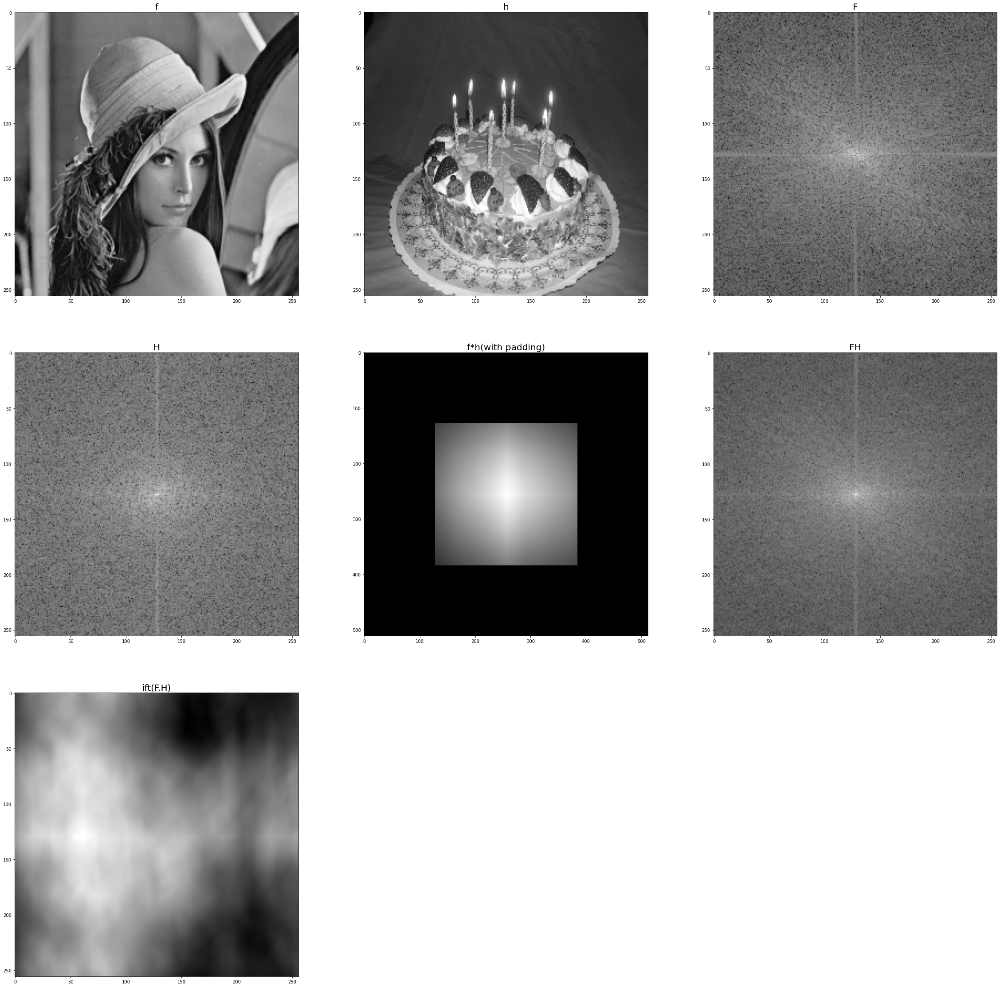

In [22]:
display_img_arr(displayImages , 3, 3,(40,40),["f","h","F","H","f*h(with padding)","FH","ift(F.H)"] )

IFT(F.H) does'nt accurately correspond to central portion of f*h. This is because the f*h will match with IFT(FH) only when the F, H in FH are calculated as Fourier of padded f and h. But here we did'nt pad the f,h before taking their fourier transform. Hence they dont match

In [23]:
def avgSqDist(FH,fh):
    fh_center = fh[128:384,128:384]
    error = 0
    for i in range(FH.shape[0]): 
        for j in range(FH.shape[1]):
            error += (FH[i][j].real - fh[i][j].real)**2
            error += (FH[i][j].imag - fh[i][j].imag)**2
    error = error/(256*256)
    return error
    

In [24]:
error = avgSqDist(np.fft.fftshift(iftFH),fconvh)
print(error)

6.370381584592728e+17


2. What changes do you observe when you zero pad the original images to dimension
(511 × 511) and now calculate IFT(F.H) and report the new error. 

In [25]:

def pad(img,b_half):
    img_pad = cv2.copyMakeBorder(img, b_half, b_half, b_half, b_half,cv2.BORDER_CONSTANT)
    return img_pad

b_half = int(256/2)
f_pad = pad(f,b_half)
h_pad = pad(h,b_half)
F = RECURSIVEtwodFFT(f_pad)
H =  RECURSIVEtwodFFT(h_pad)
FH = np.multiply(F,H)
fconvh = convolve2d(f,h)

iftfh = RECURSIVEtwodIFFT(fconvh)
iftFH = RECURSIVEtwodIFFT(FH)
images = [F,H,fconvh,FH,iftfh,iftFH]
displayImages = []

images = [F,H,fconvh,FH,iftFH]
displayImages = []
displayImages.append(f)
displayImages.append(h)
displayImages.append(np.log(1+np.abs(np.fft.fftshift(F.astype('float64')))))
displayImages.append(np.log(1+np.abs(np.fft.fftshift(H.astype('float64')))))
displayImages.append(fconvh)
displayImages.append(np.log(1+np.abs(np.fft.fftshift(FH.astype('float64')))))
displayImages.append(np.fft.fftshift(iftFH.astype('float64')))
error = avgSqDist(np.fft.fftshift(iftFH),fconvh)
print(error)

<ipython-input-25-d82cb8f91447>:22: ComplexWarning: Casting complex values to real discards the imaginary part
  displayImages.append(np.log(1+np.abs(np.fft.fftshift(F.astype('float64')))))
<ipython-input-25-d82cb8f91447>:23: ComplexWarning: Casting complex values to real discards the imaginary part
  displayImages.append(np.log(1+np.abs(np.fft.fftshift(H.astype('float64')))))
<ipython-input-25-d82cb8f91447>:25: ComplexWarning: Casting complex values to real discards the imaginary part
  displayImages.append(np.log(1+np.abs(np.fft.fftshift(FH.astype('float64')))))
<ipython-input-25-d82cb8f91447>:26: ComplexWarning: Casting complex values to real discards the imaginary part
  displayImages.append(np.fft.fftshift(iftFH.astype('float64')))


3.1356658311047674e+17


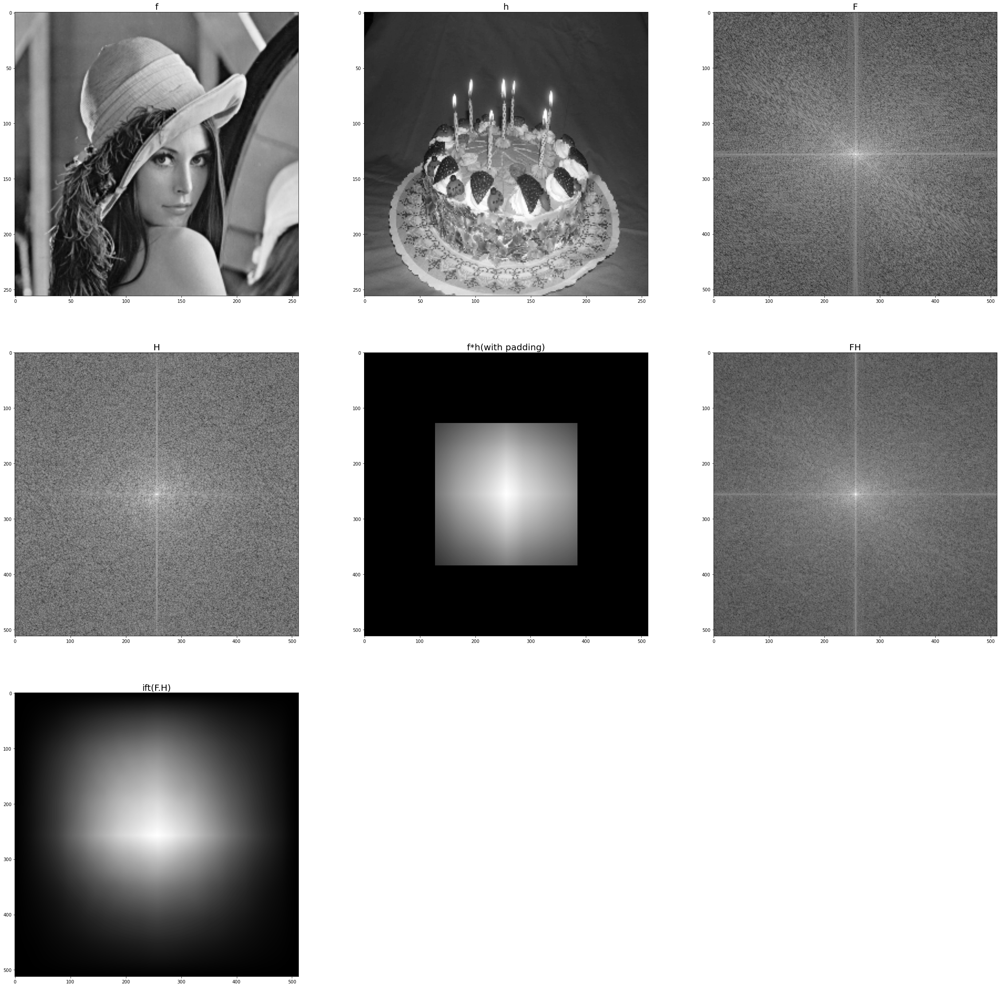

In [26]:
display_img_arr(displayImages , 3, 3,(40,40),["f","h","F","H","f*h(with padding)","FH","ift(F.H)"] )

As shown the error observed on padding is 3.1356658311047674e+17 which is less than that on non padded(6.370381584592728e+17
)<br>
It is expected to give less error when FH is caclulated with padded images(F = fft(f_pad) and H = fft(h_pad)). <br> 
f*h and FH will match because of circular property of convolution and hence we get lesser error


 Choose any 64x64 image. Now, add 64 columns and rows of zeros to the right and bottom side of the original image. Repeat this process two more times each time doubling the image size and padding the pixels on the right and bottom by zeroes. You will therefore have 4 images first one 64 × 64 with no zero padding and then 128 × 128, 256 × 256 and 512 × 512 after padding. Find the Fourier transform of all these images. Display the results and explain and justify the relationship between the four outputs you get.

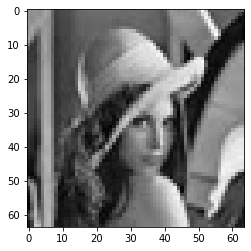

In [27]:
f = cv2.imread(path+'lena_64.jpg', cv2.IMREAD_GRAYSCALE)
plt.gray()
plt.imshow(f)

In [28]:
def addcols(img,k):
    img_pad = cv2.copyMakeBorder(img, 0, k, k, 0,cv2.BORDER_CONSTANT)
    return img_pad
f128 = addcols(f,len(f))
f256 = addcols(f128,len(f128))
f512 = addcols(f256,len(f256))
f_arr = [f,f128,f256,f512]
fft_arr = []
for im in f_arr:
    fft_arr.append(RECURSIVEtwodFFT(im))
displayImages = []
for i in range(len(fft_arr)):
    displayImages.append(np.log(1+np.abs(np.fft.fftshift(fft_arr[i].astype('float64')))))


<ipython-input-28-2f5b540fe61a>:13: ComplexWarning: Casting complex values to real discards the imaginary part
  displayImages.append(np.log(1+np.abs(np.fft.fftshift(fft_arr[i].astype('float64')))))


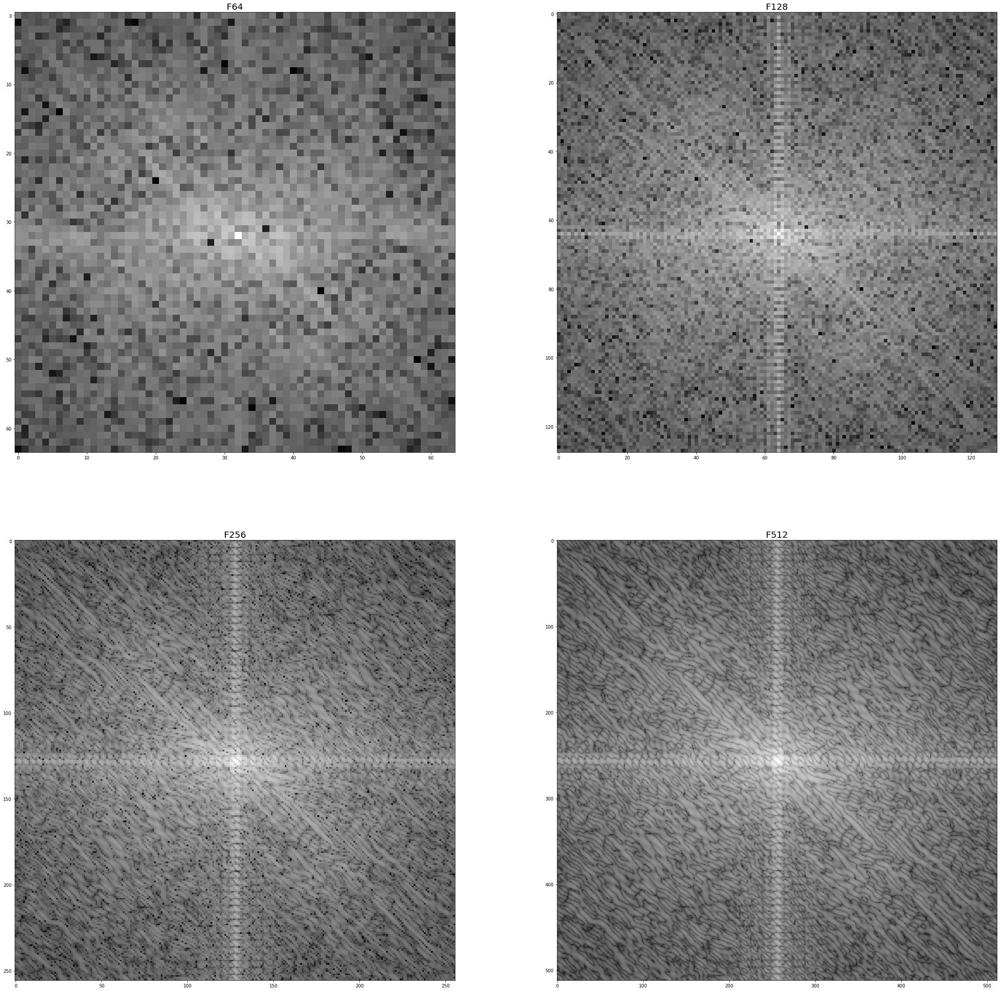

In [29]:
display_img_arr(displayImages , 2, 2,(40,40),["F64","F128","F256","F512"] )

Theoritically, We expect all spectrums to be nearly same since the intensity distribution of image won't change on padding. Hence all spectrums will be nearly identical.
Experimentally, we see that all spectrums have nearly same distribution with F64 differing a bit. F128, F256 and F512 are more identical

## 7. (15 points) Denoise the given image noisy-lena.png and explain your process.

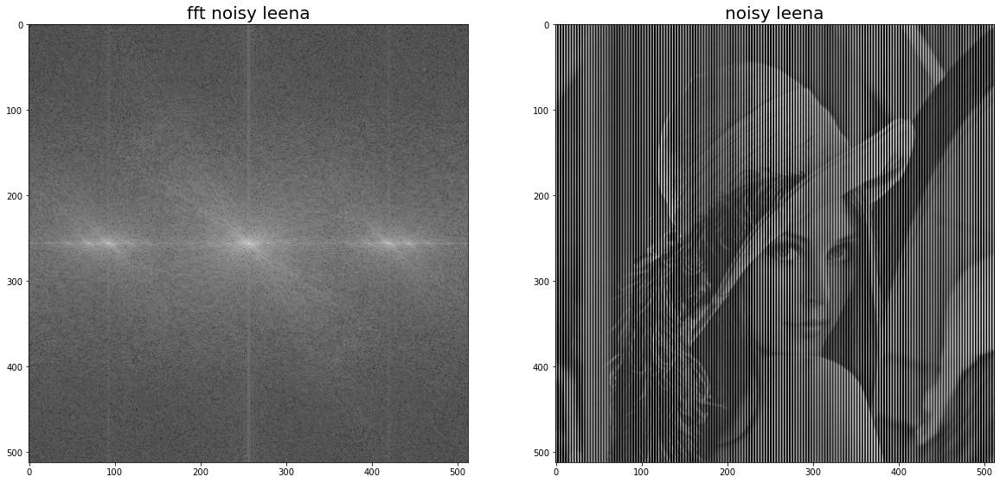

In [30]:

img = cv2.imread(path+'noisy_lena.png', cv2.IMREAD_GRAYSCALE)
f = RECURSIVEtwodFFT(img)
fshift = np.fft.fftshift(f)
images.append(np.log(1 + np.abs(fshift)))
display_img_arr([np.log(1 + np.abs(fshift)),img], 1, 2, (20, 20),['fft noisy leena','noisy leena'])

We see that image has 3 spectrums in frequency domain, the vertical lines are due to other two extra spectrums on left and right.
So, we attempt to remove those two spectrums only keeping the mid one. 

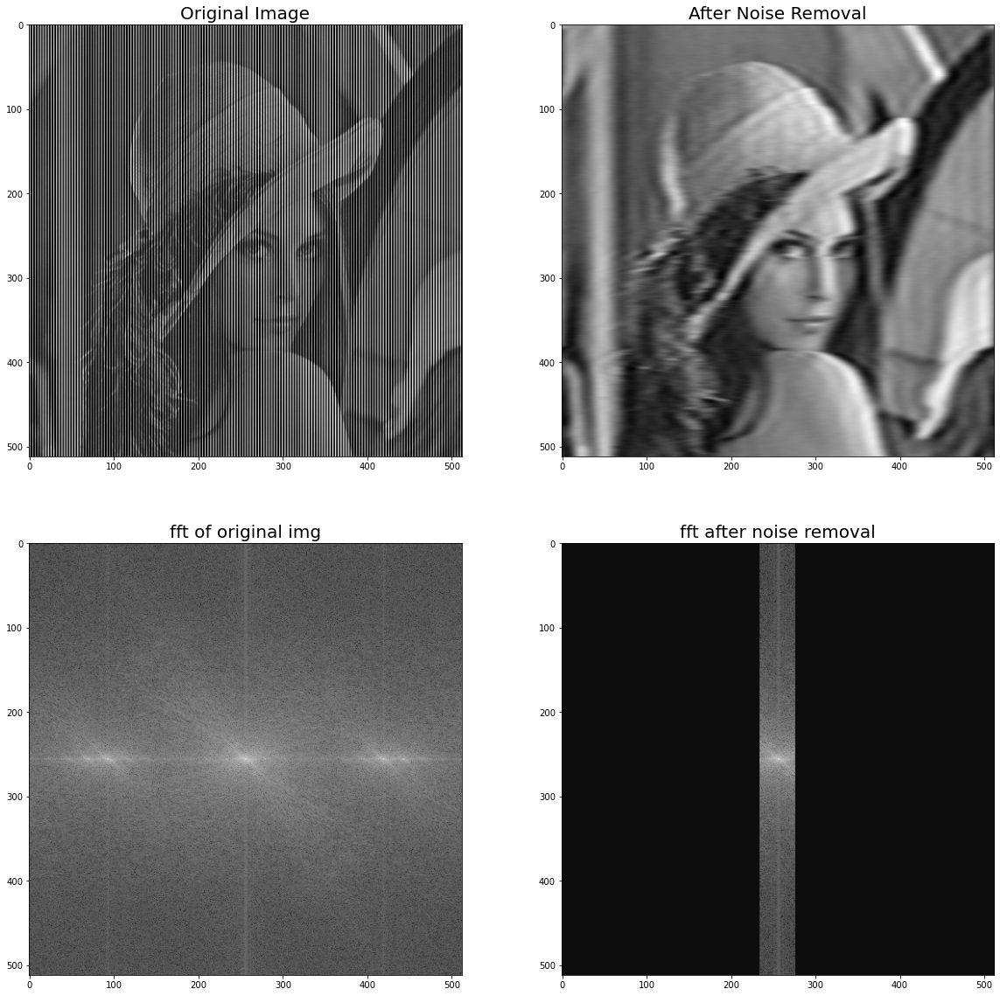

In [31]:
new_fft = np.copy(fshift)
new_fft[:,:234] = 10
new_fft[:,276:] = 10
scaled_fft = np.log(1 + np.abs(fshift))
ifft = np.abs(RECURSIVEtwodIFFT(np.conj(new_fft)))
display_img_arr([img,ifft.astype('float64'),scaled_fft,np.log(1 + np.abs(new_fft))], 2, 2, (20, 20), ['Original Image','After Noise Removal','fft of original img','fft after noise removal'])

On multiplying the matrix on left and right side of spectrum with small value, we see our noise in Leena is somewhat removed but the value becomes too small and tends towards black and hence gets artifacts

 Note: This is same as multiplying with a filter which removes the particular band(makes it near zero) in our case: new_fft[:,:234] and 
new_fft[:,276:]

In [32]:
print(f[0][3])

(-45348.28957457126+148110.18068557215j)


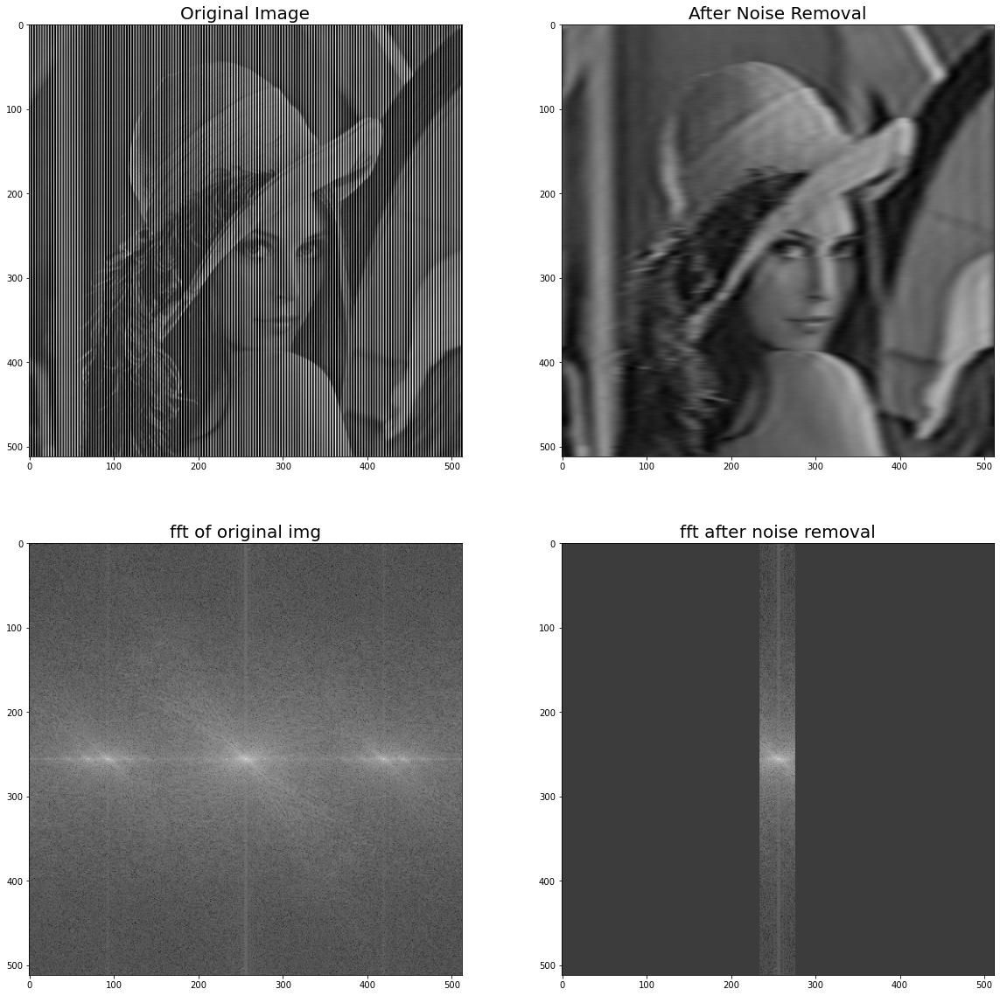

In [33]:
new_fft = np.copy(fshift)
new_fft[:,:234] = fshift[0][3]
new_fft[:,276:] = fshift[0][3]
ifft = np.abs(RECURSIVEtwodIFFT(np.conj(new_fft)))
display_img_arr([img,ifft.astype('float64'),scaled_fft,np.log(1 + np.abs(new_fft))], 2, 2, (20, 20), ['Original Image','After Noise Removal','fft of original img','fft after noise removal'])

So trying to replace  the pixels with one of pixels of fft matrix itself, we get a better spectrum and netter img.<br>
Now,Trying to remove the strips at top and botoom too

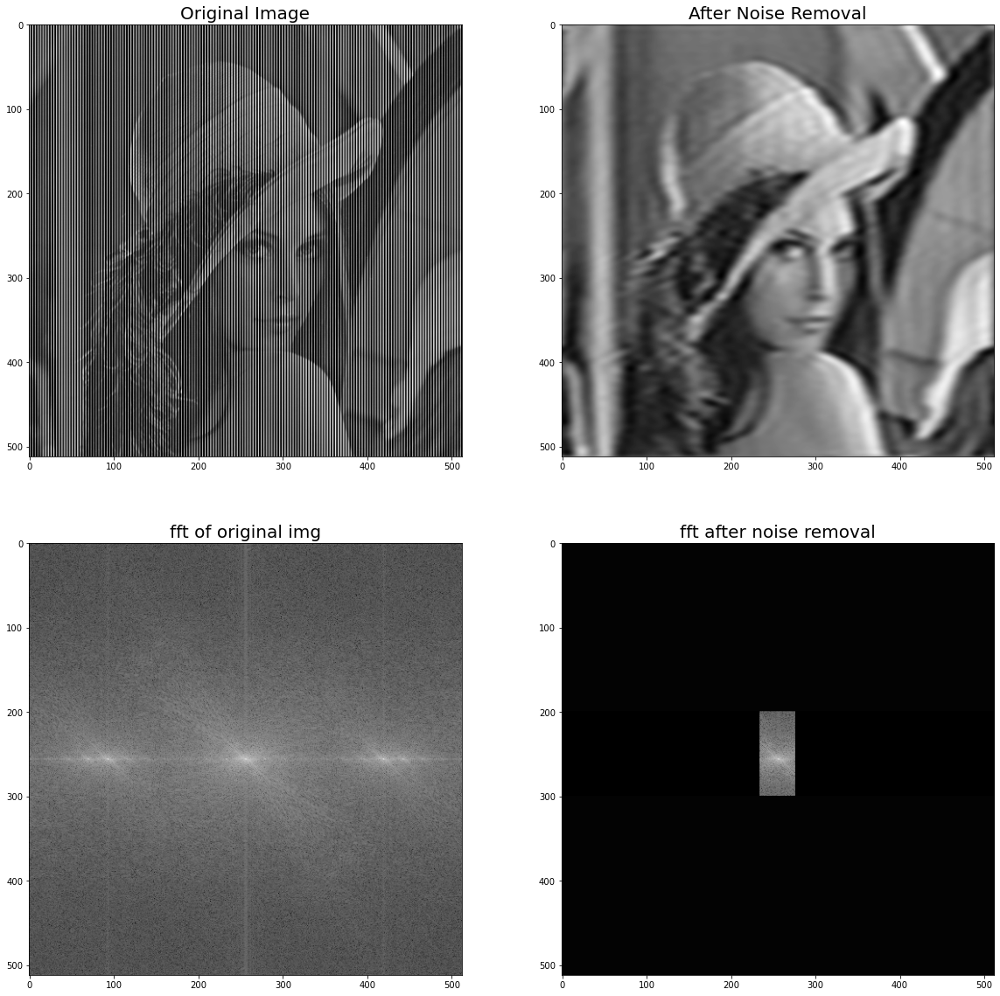

In [34]:
new_fft = np.copy(fshift)
new_fft[:,:234] = 10
new_fft[:,276:] = 10
new_fft[300:512,:] = 12
new_fft[0:200:,:] = 12
ifft = np.abs(RECURSIVEtwodIFFT(np.conj(new_fft)))
display_img_arr([img,ifft.astype('float64'),scaled_fft,np.log(1 + np.abs(new_fft))], 2, 2, (20, 20), ['Original Image','After Noise Removal','fft of original img','fft after noise removal'])

We see its nearly the same output on doing the above step